<a href="https://colab.research.google.com/github/htdung167/CS112.L21.N7/blob/main/ThucNghiem/CaiDatPhanCum.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Cài đặt các thư viện, hàm và dữ liệu cần thiết**

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt 
import cv2 as cv
from google.colab.patches import cv2_imshow
from sklearn.cluster import KMeans
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.mixture import GaussianMixture
import scipy.stats
from sklearn.metrics import silhouette_score

In [ ]:
!pip install fuzzy-c-means
from fcmeans import FCM

     |████████████████████████████████| 15.7 MB 7.0 MB/s 
     |████████████████████████████████| 10.1 MB 33.5 MB/s 
  Attempting uninstall: numpy
    Found existing installation: numpy 1.19.5
    Uninstalling numpy-1.19.5:
      Successfully uninstalled numpy-1.19.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
yellowbrick 1.3.post1 requires numpy<1.20,>=1.16.0, but you have numpy 1.21.5 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


In [ ]:
os.chdir("/content/drive/MyDrive/CS231.M11_NhapMonThiGiacMayTinh/Cài đặt")

In [ ]:
def VisualImages(lst_image, lst_title=None):
  plt.figure(figsize=(15,15))
  plt.axis("off")
  n = len(lst_image)
  if lst_title==None:
    for i in range(n):
      plt.subplot(1, n, i+1)
      lst_image[i] = cv.cvtColor(lst_image[i], cv.COLOR_BGR2RGB)
      lst_image[i] = plt.imshow(lst_image[i], interpolation="bicubic")
  else:
    for i in range(n):
      plt.subplot(1, n, i+1)
      lst_image[i] = cv.cvtColor(lst_image[i], cv.COLOR_BGR2RGB)
      lst_image[i] = plt.imshow(lst_image[i], interpolation="bicubic")
      plt.title(lst_title[i])
  plt.show()

In [ ]:
images_dir = "/content/drive/MyDrive/CS231.M11_NhapMonThiGiacMayTinh/Cài đặt/Images"

In [ ]:
img1 = cv.imread("/content/drive/MyDrive/CS231.M11_NhapMonThiGiacMayTinh/Cài đặt/Images/rCDFA.png")
img2 = cv.imread("/content/drive/MyDrive/CS231.M11_NhapMonThiGiacMayTinh/Cài đặt/Images/unnamed.jpg")
img3 = cv.imread("/content/drive/MyDrive/CS231.M11_NhapMonThiGiacMayTinh/Cài đặt/Images/vegetables.jpg")
img4 = cv.imread("/content/drive/MyDrive/CS231.M11_NhapMonThiGiacMayTinh/Cài đặt/Images/247879485_634939567684344_6738940973349488477_n.jpg")
img5 = cv.imread("/content/drive/MyDrive/CS231.M11_NhapMonThiGiacMayTinh/Cài đặt/Images/thuoc.jpg")

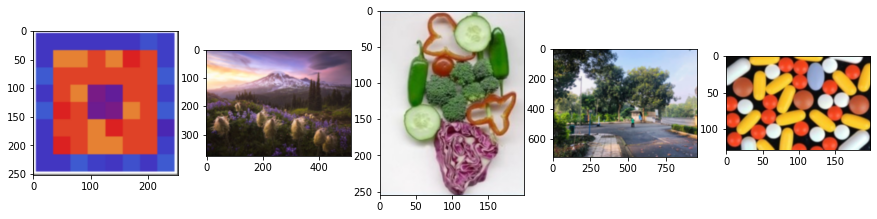

In [ ]:
VisualImages([img1, img2, img3, img4, img5])

#**II. Cài đặt các thuật toán phân cụm**

In [ ]:
import time
def algo_kmeans(X, k, cal_score):
  score = None
  k_means = KMeans(n_clusters = k, random_state = 0).fit(X)
  tt = k_means.cluster_centers_[k_means.labels_]
  timee = 0
  if cal_score:
    t1 = time.time()
    score = silhouette_score(X, k_means.labels_)
    t2 = time.time()
    timee = t2 - t1
  return tt, score, timee
def algo_fcm(X, k, cal_score):
  score = None
  fcm = FCM(n_clusters=k)
  fcm.fit(np.array(X))
  fcm_labels = fcm.predict(np.array(X))
  tt = fcm.centers[fcm_labels]
  timee = 0
  if cal_score:
    t1 = time.time()
    score = silhouette_score(X, fcm_labels)
    t2 = time.time()
    timee = t2 - t1
  return tt, score, timee
def algo_meanshift(X,k,cal_score):
  score = None
  bandwidth_=estimate_bandwidth(X, quantile=0.2, n_samples=500)
  if k!=0:
    bandwidth_=k
  print("Bandwidth:", bandwidth_)
  ms = MeanShift(bandwidth=bandwidth_, bin_seeding=True)
  ms.fit(X)
  tt = ms.cluster_centers_[ms.labels_]
  print('Số cụm: ', len(set(ms.labels_.tolist())))
  timee = 0
  if cal_score:
    t1 = time.time()
    score = silhouette_score(X, ms.labels_)
    t2 = time.time()
    timee = t2 - t1
  return tt, score, timee
def algo_em(X, k,cal_score):
  score = None
  em = GaussianMixture(n_components=k, max_iter=20, random_state=0).fit(X)
  centers = np.empty(shape=(em.n_components, X.shape[1]))
  for i in range(em.n_components):
    density = scipy.stats.multivariate_normal.logpdf(X,cov=em.covariances_[i], mean=em.means_[i], allow_singular=True)
    centers[i, :] = X[np.argmax(density)]
  pred = em.predict(X)
  tt = centers[pred]
  timee = 0
  if cal_score:
    t1 = time.time()
    score = silhouette_score(X, pred)
    t2 = time.time()
    timee = t2 - t1
  return tt, score, timee

def feature_input(coor, img):
  nrow, ncol,nchl = img.shape
  g = []
  if coor ==0:
     g = img.reshape(nrow*ncol,nchl)
  elif coor==1:
    for i in range(nrow):
      for j in range(ncol):
        temp = [img[i][j][0], img[i][j][1], img[i][j][2], i, j]
        g.append(temp)
  elif coor==2: 
    for i in range(nrow):
      for j in range(ncol):
        temp = [img[i][j][0], img[i][j][1], img[i][j][2], int(i/nrow*255), int(i/ncol*255)]
        g.append(temp)
  g = np.array(g)
  return g 

def ClusteringAlgorithms(img, option='km', k=6, coor=0, cal_score=False, resize_=True):
  if resize_==True:
    if img.shape[1] <=250:
      img_t = img
    else:
      dim = (int(img.shape[1] * 250/ img.shape[0]), 250)
      img_t = cv.resize(img, dim, cv.INTER_AREA)
  else:
    img_t = img
  nrow, ncol,nchl = img_t.shape
  g = feature_input(coor, img_t)

  if option=='km':
    tt, score_res, timee = algo_kmeans(g, k, cal_score)

  elif option=='fcm': #fuzzy cmeans
    tt, score_res, timee = algo_fcm(g, k, cal_score)

  elif option=='ms': #meanshift
    tt, score_res, timee = algo_meanshift(g,k, cal_score)

  elif option=='em': #Expectation Maximization
    tt, score_res, timee = algo_em(g, k, cal_score)
  
  t = tt[:,0:3]
  img_res = t.reshape(nrow, ncol, nchl)
  if resize_== True:
    img_res = cv.resize(img_res, (img.shape[1], img.shape[0]), cv.INTER_NEAREST)
  
  return img_t, img_res, score_res, timee

def Visual_Result(img, algo, coor, cal_score, k=6, resize_=True):
  img_t, img_res, score_res, timee = ClusteringAlgorithms(img, algo, k, coor, cal_score, resize_)
  print("Time to evaluate:", timee, "s")
  print("Silhouette Coefficient:", score_res)
  print()
  VisualImages([img, img_res.astype('uint8')], ['Origin', 'After clustering'])

#**Thử nghiệm 1: Cố định cụm, cố định đặc trưng RBG thay đổi thuật toán**

###**Ảnh 1**

Time to evaluate: 63.85554385185242 s
Silhouette Coefficient: 0.8898475393724644



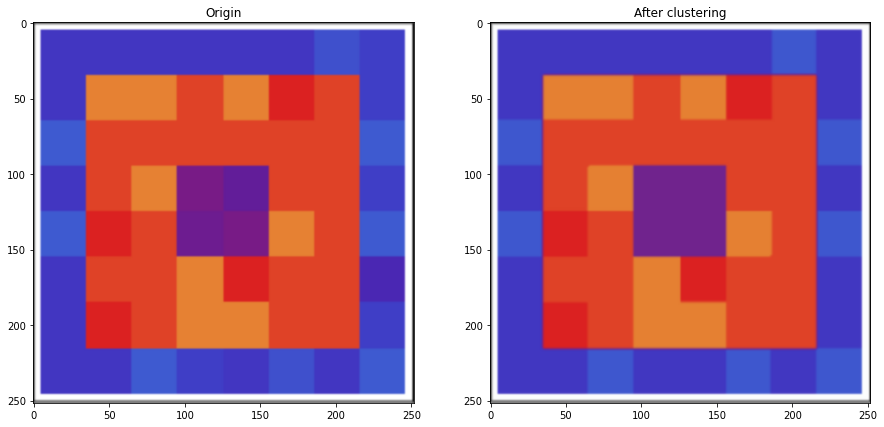

In [ ]:
Visual_Result(img=img1, algo='km', k = 10, coor=0, cal_score = True)

Time to evaluate: 62.20672249794006 s
Silhouette Coefficient: 0.8407332834557492



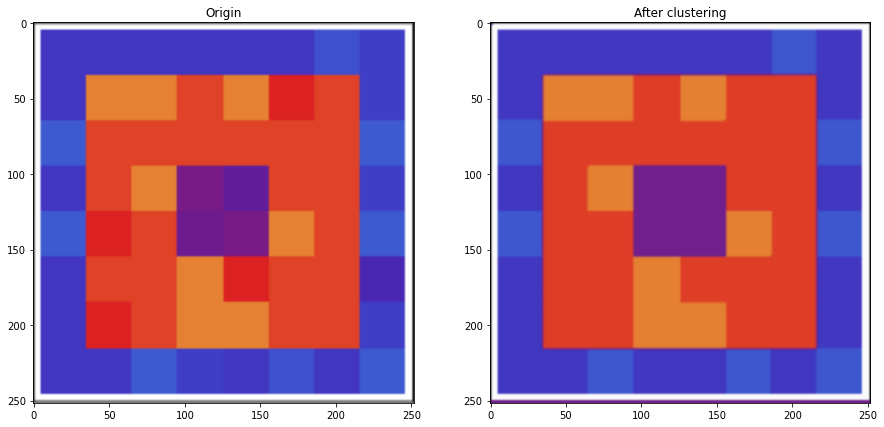

In [ ]:
Visual_Result(img=img1, algo='fcm', k = 10, coor=0, cal_score = True)

Bandwidth: 40.72228887727494
Số cụm:  10
Time to evaluate: 68.73748421669006 s
Silhouette Coefficient: 0.8368751127614356



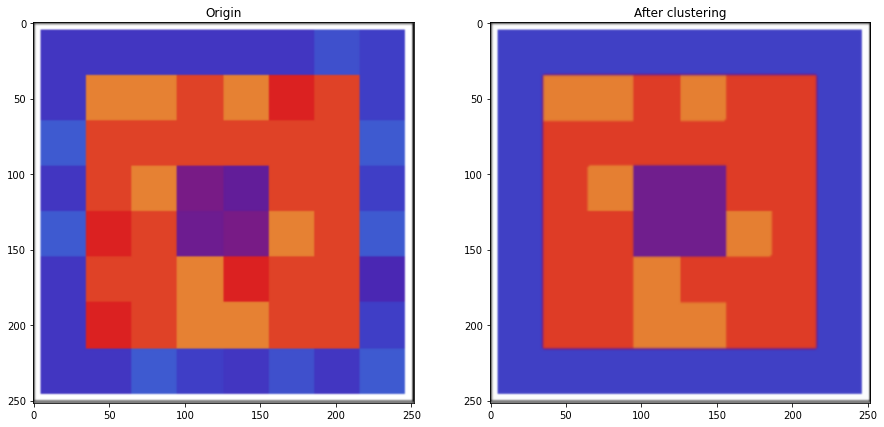

In [ ]:
Visual_Result(img=img1, algo='ms', k=0, coor=0, cal_score = True)

Time to evaluate: 65.53734540939331 s
Silhouette Coefficient: 0.8042075849620288



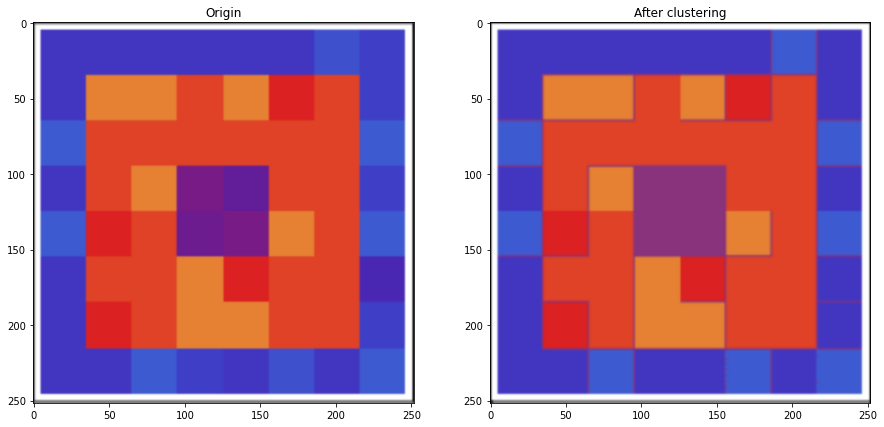

In [ ]:
Visual_Result(img=img1, algo='em', k = 10, coor=0, cal_score = True)

###**Ảnh 2**

Time to evaluate: 120.0534119606018 s
Silhouette Coefficient: 0.4745246078251463



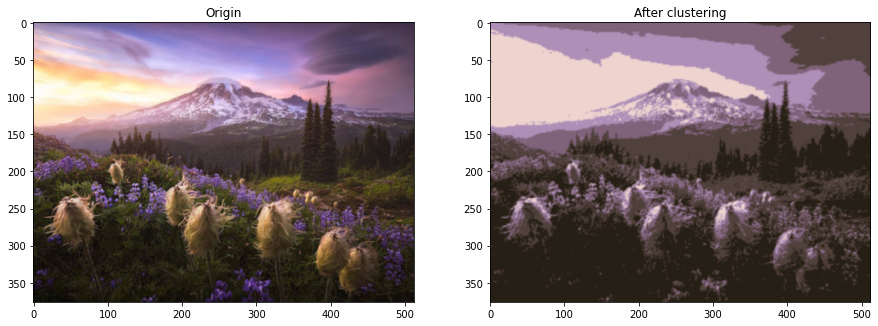

In [ ]:
Visual_Result(img=img2, algo='km', k = 5, coor=0, cal_score = True)

Time to evaluate: 117.40233898162842 s
Silhouette Coefficient: 0.4715847552405402



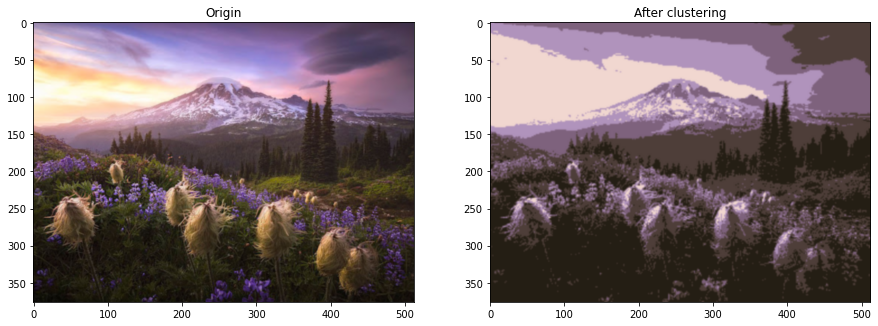

In [ ]:
Visual_Result(img=img2, algo='fcm', k = 5, coor=0, cal_score = True)

Bandwidth: 30
Số cụm:  5
Time to evaluate: 123.11226725578308 s
Silhouette Coefficient: 0.48944597319124755



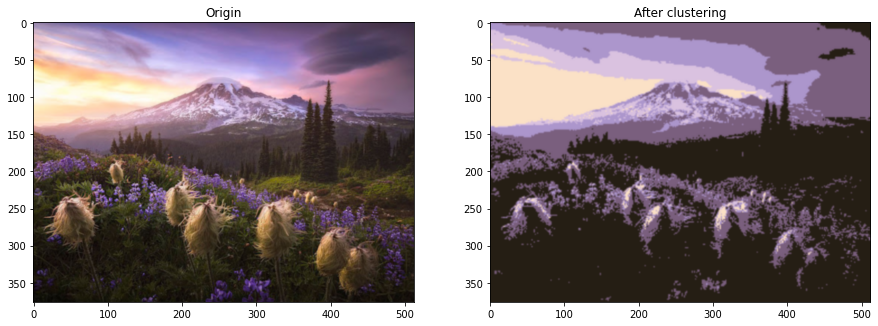

In [ ]:
Visual_Result(img=img2, algo='ms', k=30, coor=0, cal_score = True)

/usr/local/lib/python3.7/dist-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


Time to evaluate: 117.36610388755798 s
Silhouette Coefficient: 0.35149824378638933



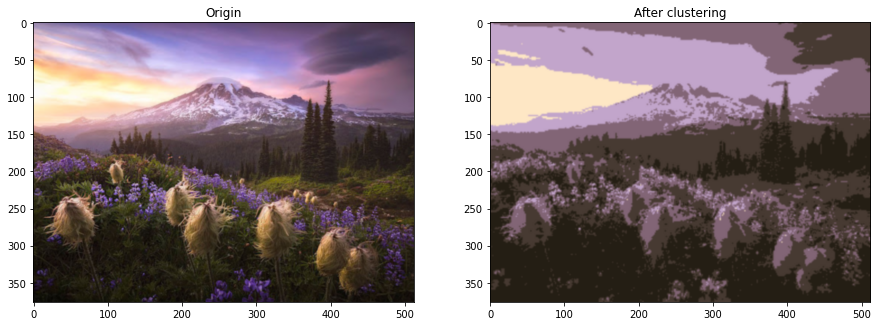

In [ ]:
Visual_Result(img=img2, algo='em',k=5, coor=0, cal_score = True)

#**Thử nghiệm 2: Cố định cụm, cố định thuật toán, thay đổi đặc trưng**

###**Kmeans**

Time to evaluate: 41.068283796310425 s
Silhouette Coefficient: 0.5170455927368801



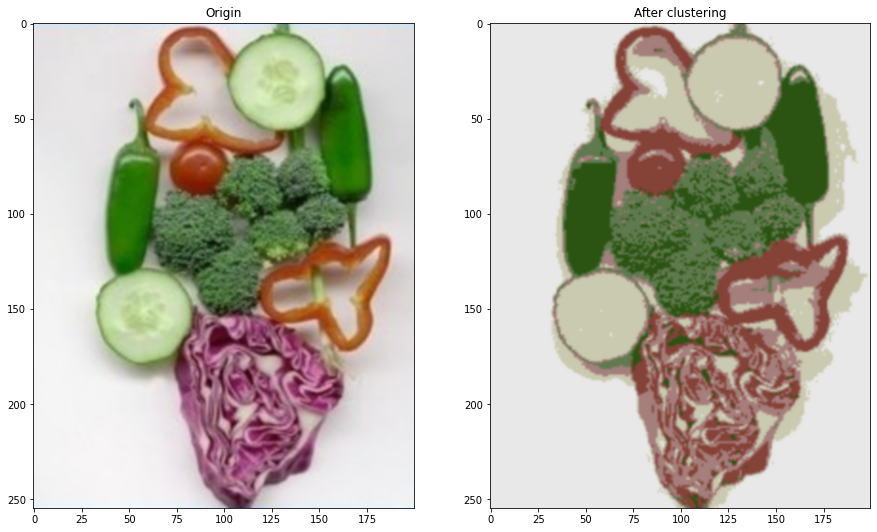

In [ ]:
Visual_Result(img=img3, algo='km', k = 6, coor=0, cal_score=True)

Time to evaluate: 41.68773698806763 s
Silhouette Coefficient: 0.3864136574989641



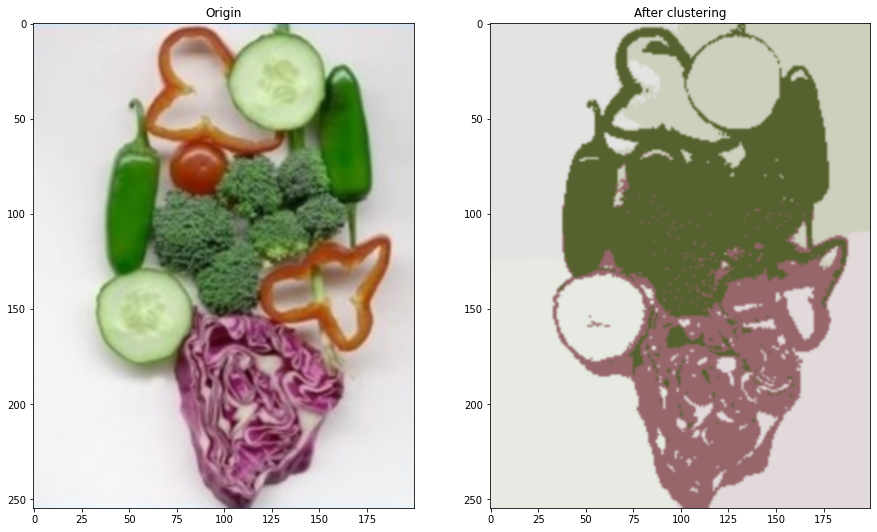

In [ ]:
Visual_Result(img=img3, algo='km', coor=1, cal_score=True)

Time to evaluate: 41.85196566581726 s
Silhouette Coefficient: 0.4500119625816293



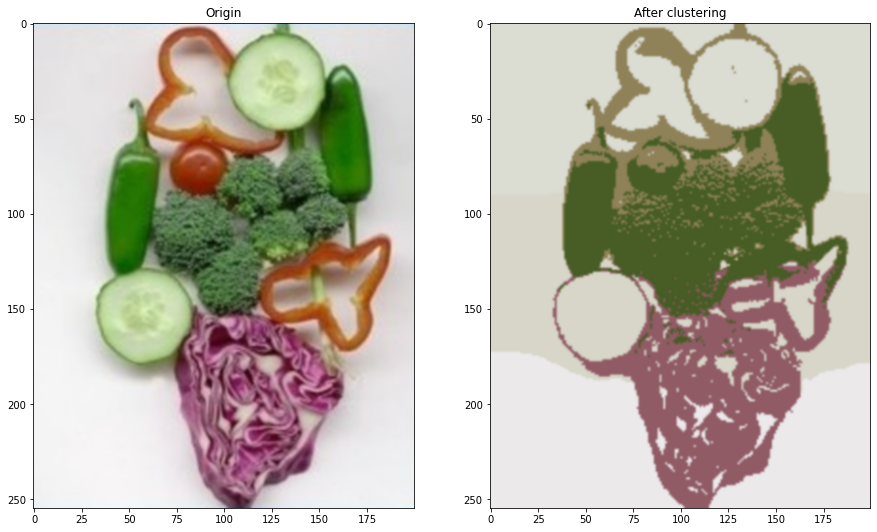

In [ ]:
Visual_Result(img=img3, algo='km', coor=2, cal_score=True)

###**FCM**

Time to evaluate: 108.11499118804932 s
Silhouette Coefficient: 0.3747258543784903



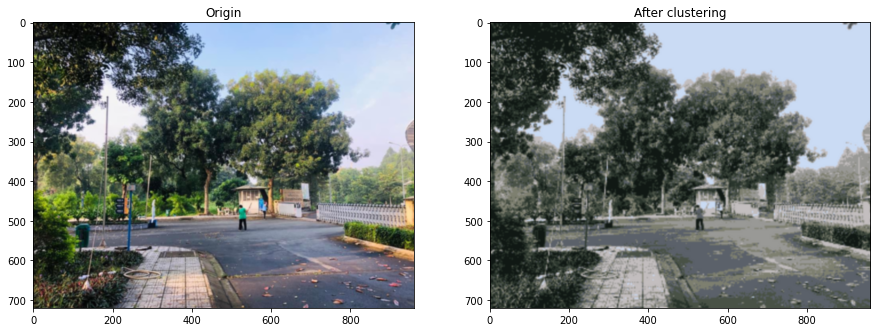

In [ ]:
Visual_Result(img=img4, algo='fcm', k = 8, coor=0, cal_score=True)

Time to evaluate: 111.89686274528503 s
Silhouette Coefficient: 0.30944462238974674



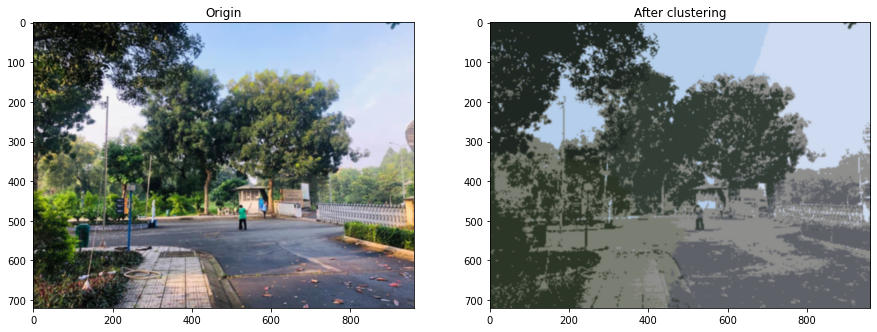

In [ ]:
Visual_Result(img=img4, algo='fcm', k = 8, coor=1, cal_score=True)

Time to evaluate: 110.99445581436157 s
Silhouette Coefficient: 0.3701821090686988



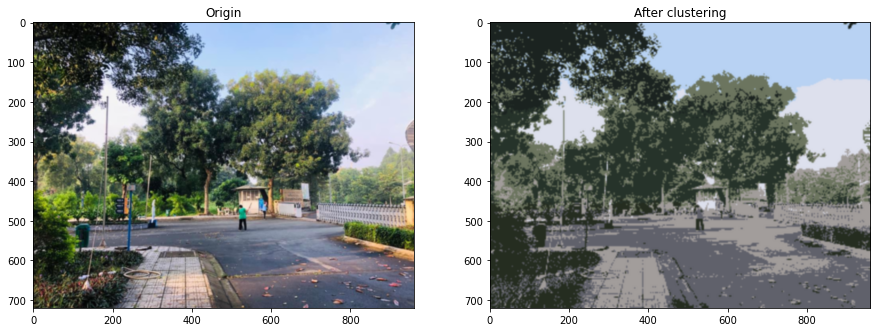

In [ ]:
Visual_Result(img=img4, algo='fcm', k = 8, coor=2, cal_score=True)

###**Mean shift**

In [ ]:
img6 = cv.imread("/content/drive/MyDrive/CS231.M11_NhapMonThiGiacMayTinh/Cài đặt/Images/hand.jpg")

Bandwidth: 37.997712015251274
Số cụm:  3
Time to evaluate: 101.28411364555359 s
Silhouette Coefficient: 0.6908289072701563



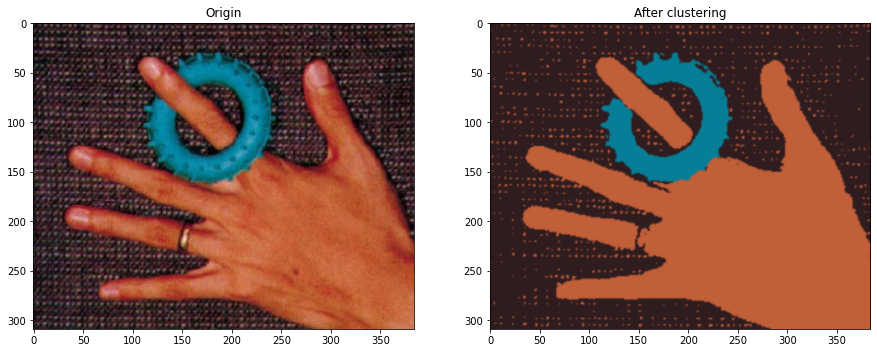

In [ ]:
Visual_Result(img=img6, algo='ms',k=0, coor=0, cal_score=True)

Bandwidth: 122.75283546544975
Số cụm:  3
Time to evaluate: 101.62277889251709 s
Silhouette Coefficient: 0.37639896932297856



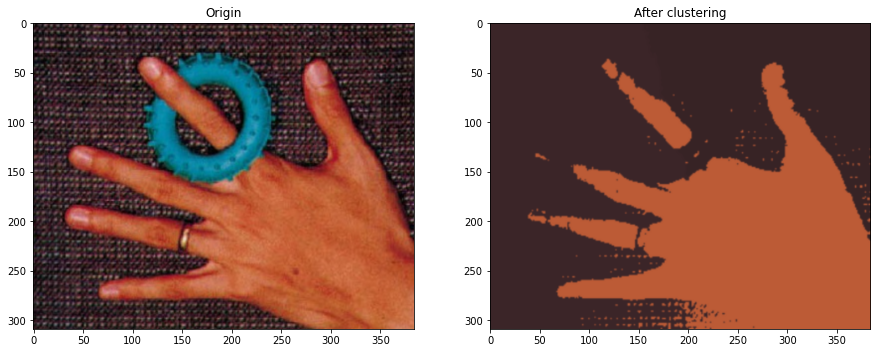

In [ ]:
Visual_Result(img=img6, algo='ms',k=0, coor=1, cal_score=True)

Bandwidth: 88.77978131211734
Số cụm:  4
Time to evaluate: 101.9035325050354 s
Silhouette Coefficient: 0.47669550301732416



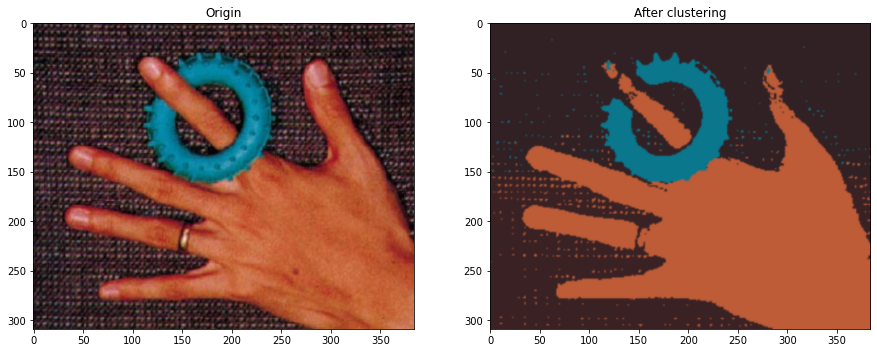

In [ ]:
Visual_Result(img=img6, algo='ms',k=0, coor=2, cal_score=True)

###**EM**

Time to evaluate: 10.0521240234375 s
Silhouette Coefficient: 0.4798158488209398



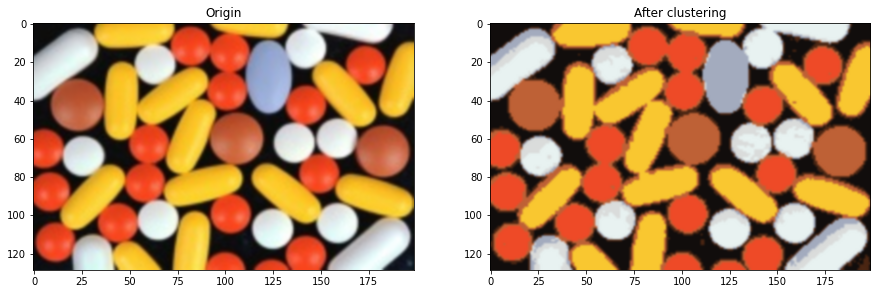

In [ ]:
Visual_Result(img=img5, algo='em', k=8, coor=0, cal_score=True)

/usr/local/lib/python3.7/dist-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


Time to evaluate: 9.93352746963501 s
Silhouette Coefficient: 0.25991704844963204



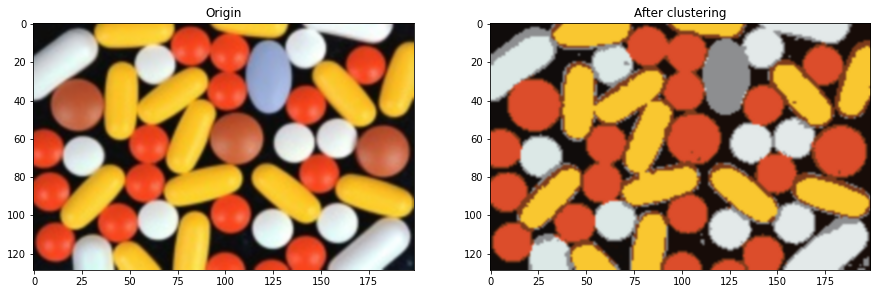

In [ ]:
Visual_Result(img=img5, algo='em', k=8,coor=1, cal_score=True)

/usr/local/lib/python3.7/dist-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


Time to evaluate: 10.061946392059326 s
Silhouette Coefficient: 0.26487414128242576



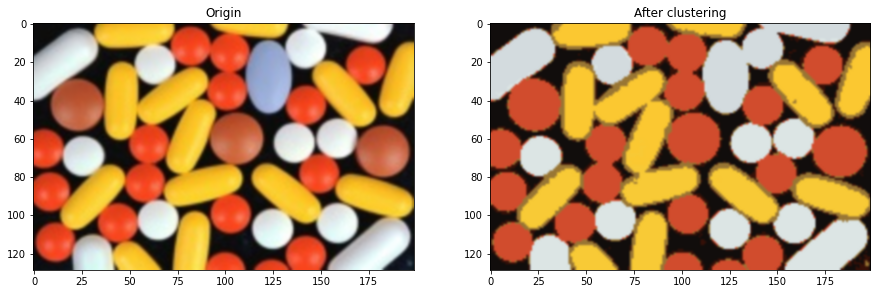

In [ ]:
Visual_Result(img=img5, algo='em', k=8,coor=2, cal_score=True)

#**Thử nghiệm *: Test MS**

Bandwidth: 10
Số cụm:  116
Time to evaluate: 116.2409143447876 s
Silhouette Coefficient: 0.19540305967394406



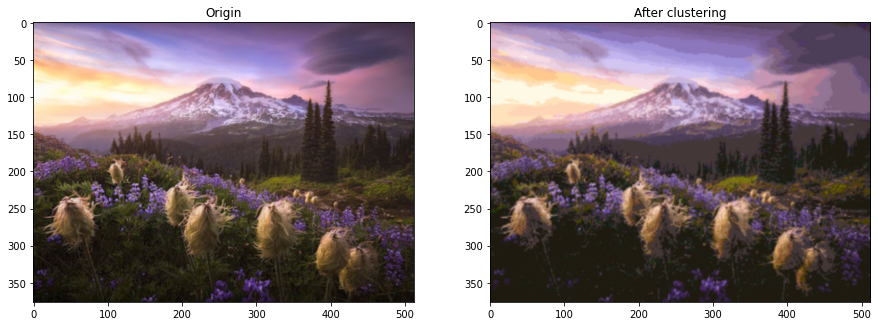

In [ ]:
Visual_Result(img=img2, algo='ms', k=10, coor=0, cal_score = True)

Bandwidth: 10
Số cụm:  5689
Time to evaluate: 115.46969246864319 s
Silhouette Coefficient: 0.21706379244949908



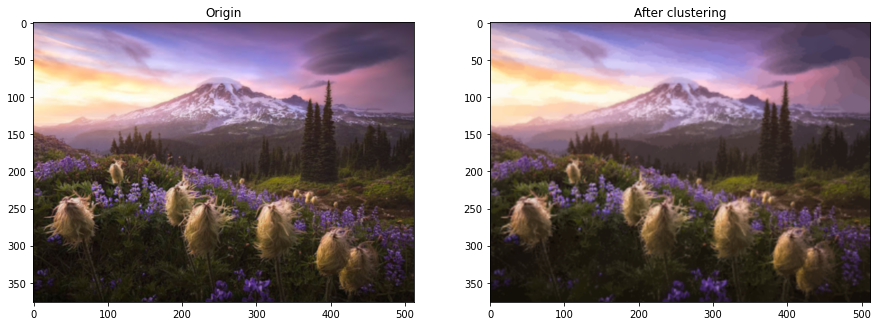

In [ ]:
Visual_Result(img=img2, algo='ms', k=10, coor=1, cal_score = True)

Bandwidth: 10
Số cụm:  1365
Time to evaluate: 116.55233788490295 s
Silhouette Coefficient: 0.17457419915069078



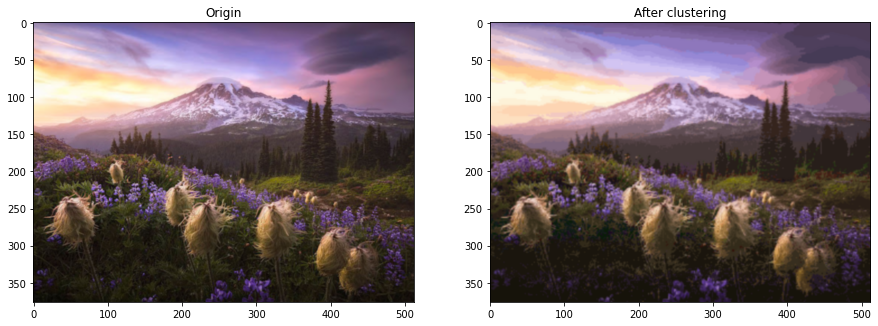

In [ ]:
Visual_Result(img=img2, algo='ms', k=10, coor=2, cal_score = True)

Meanshift có bandwidth càng bé, thì phân đoạn càng chính xác

Bandwidth: 10
Time to evaluate: 72.58243870735168 s
Silhouette Coefficient: 0.9229856657111528



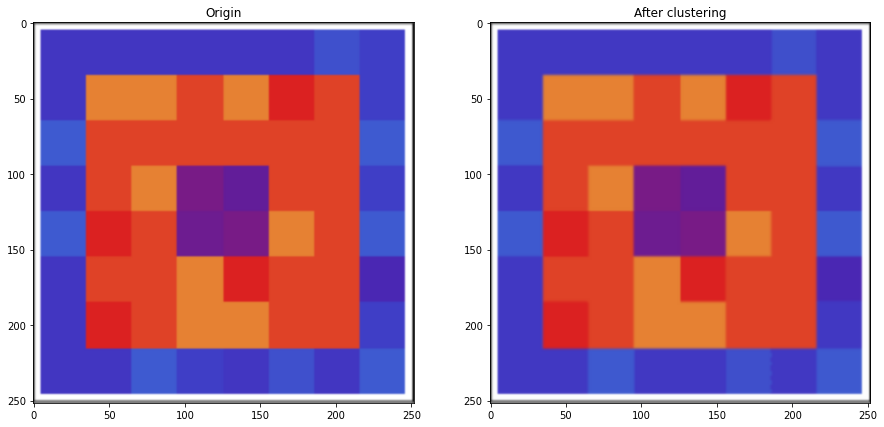

In [ ]:
Visual_Result(img=img1, algo='ms', k=10, coor=0, cal_score = True)

Bandwidth: 10
Time to evaluate: 67.40318036079407 s
Silhouette Coefficient: 0.3682381153728243



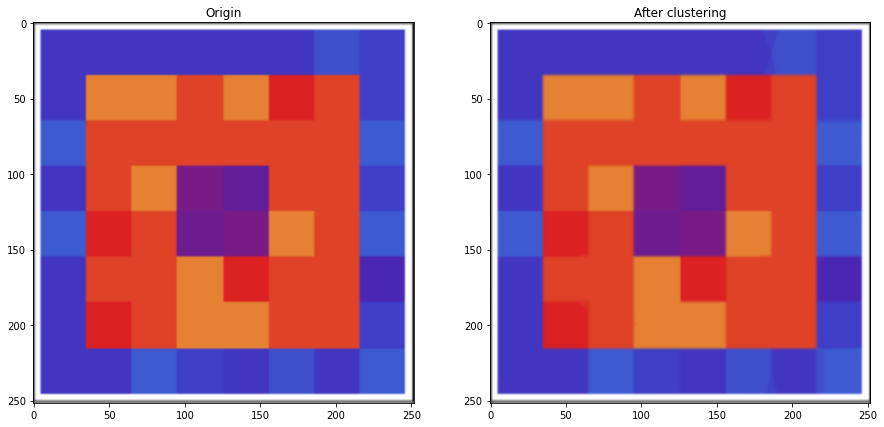

In [ ]:
Visual_Result(img=img1, algo='ms', k=10, coor=1, cal_score = True)

Bandwidth: 10
Time to evaluate: 70.43535566329956 s
Silhouette Coefficient: 0.5167808614192607



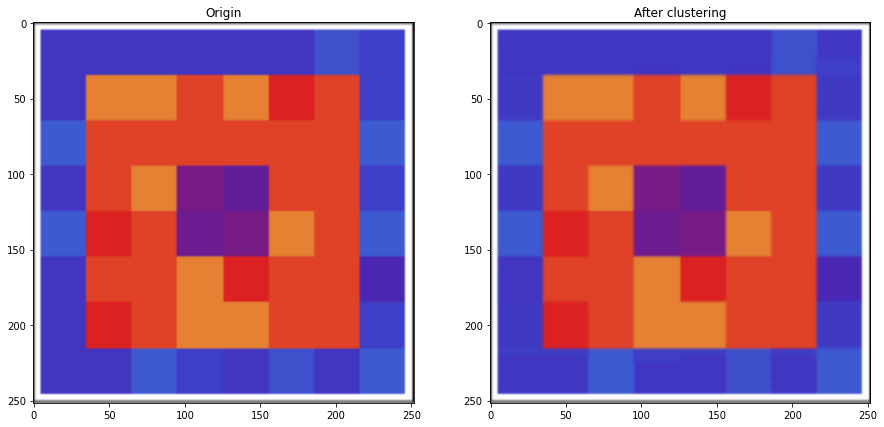

In [ ]:
Visual_Result(img=img1, algo='ms', k=10, coor=2, cal_score = True)

#**Thử nghiệm 3: Cố định cụm, cố định đặc trưng RGBXY, thay đổi thuật toán**

Time to evaluate: 62.16466546058655 s
Silhouette Coefficient: 0.36346628038704837



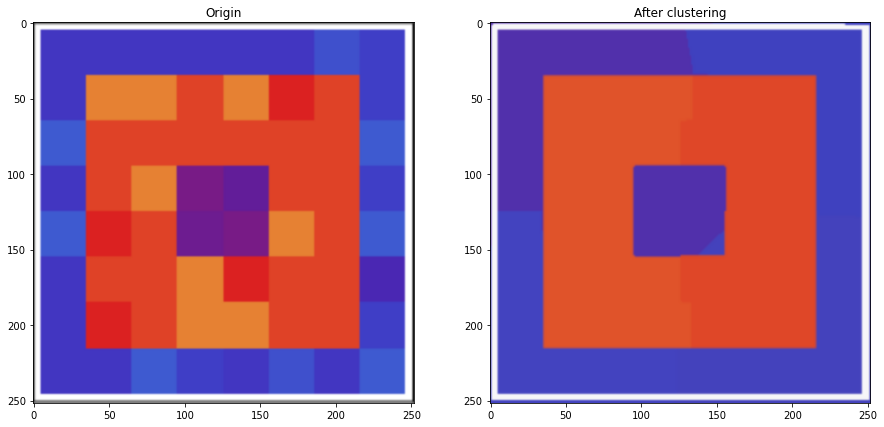

In [ ]:
Visual_Result(img=img1, algo='km', k = 7, coor=1, cal_score = True)

Time to evaluate: 62.133172035217285 s
Silhouette Coefficient: 0.30053915484482796



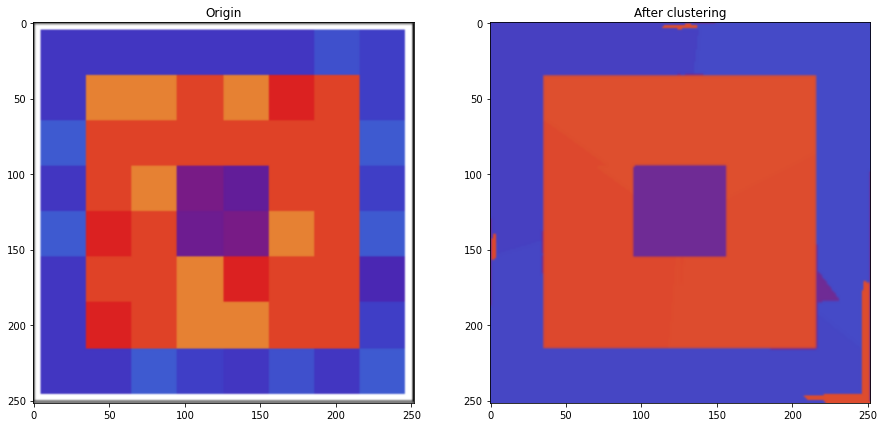

In [ ]:
Visual_Result(img=img1, algo='fcm', k = 7, coor=1, cal_score = True)

Bandwidth: 138.7948821377083
Time to evaluate: 62.79304313659668 s
Silhouette Coefficient: 0.361510501471149



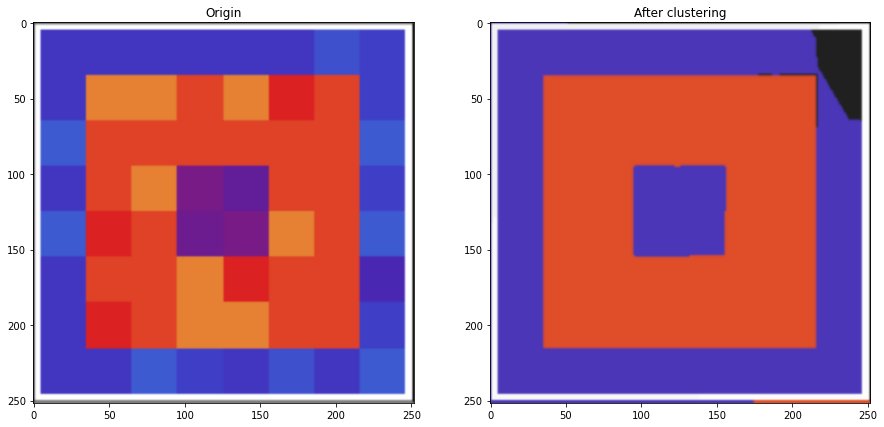

In [ ]:
Visual_Result(img=img1, algo='ms', k = 0, coor=1, cal_score = True)

Time to evaluate: 62.35754132270813 s
Silhouette Coefficient: 0.06406777126018823



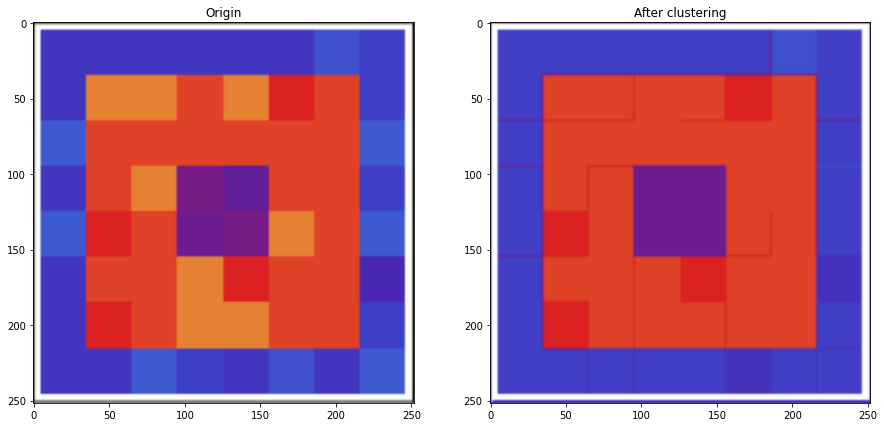

In [ ]:
Visual_Result(img=img1, algo='em', k = 7, coor=1, cal_score = True)

#**Thử nghiệm 4: Cố định cụm, cố định đặc trưng RGBX'Y', thay đổi thuật toán**

Time to evaluate: 70.9664056301117 s
Silhouette Coefficient: 0.5904590773799199



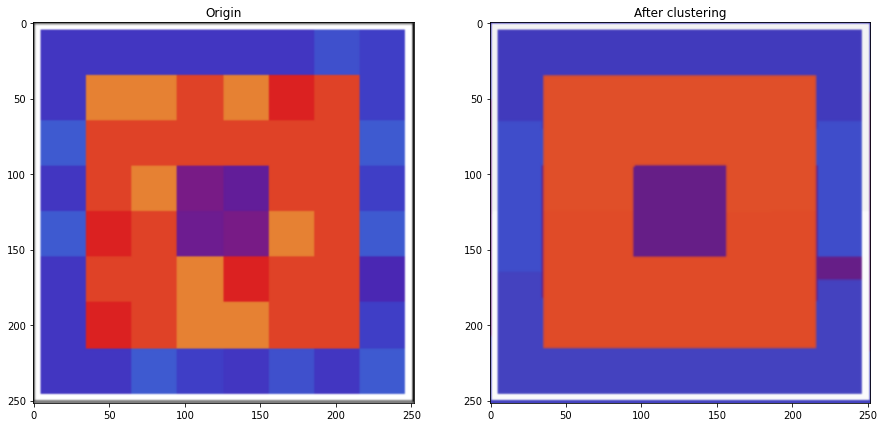

In [ ]:
Visual_Result(img=img1, algo='km', k = 8, coor=2, cal_score = True)

Time to evaluate: 68.13007855415344 s
Silhouette Coefficient: 0.4390480990654461



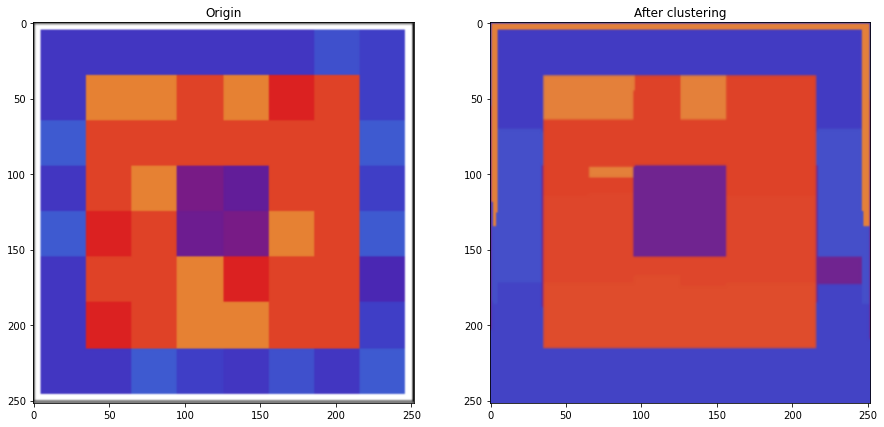

In [ ]:
Visual_Result(img=img1, algo='fcm', k = 8, coor=2, cal_score = True)

Bandwidth: 119.75072096686401
Số cum:  8
Time to evaluate: 77.19912672042847 s
Silhouette Coefficient: 0.5311645109270368



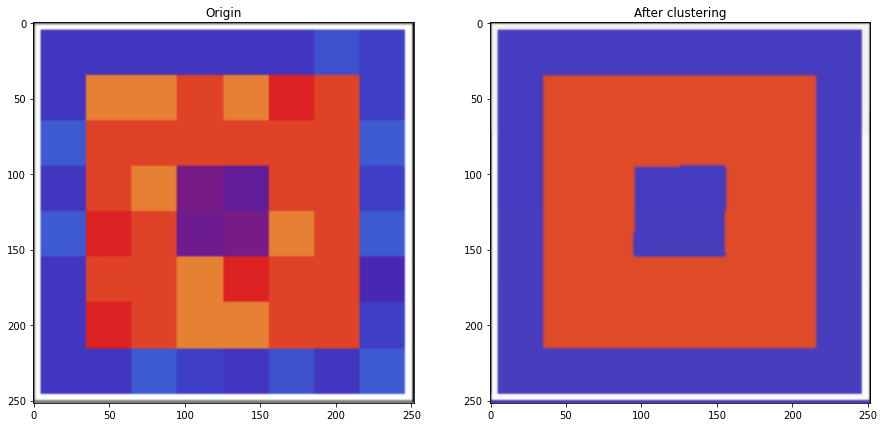

In [ ]:
Visual_Result(img=img1, algo='ms', k = 0, coor=2, cal_score = True)

Time to evaluate: 66.55611658096313 s
Silhouette Coefficient: -0.030057282672395227



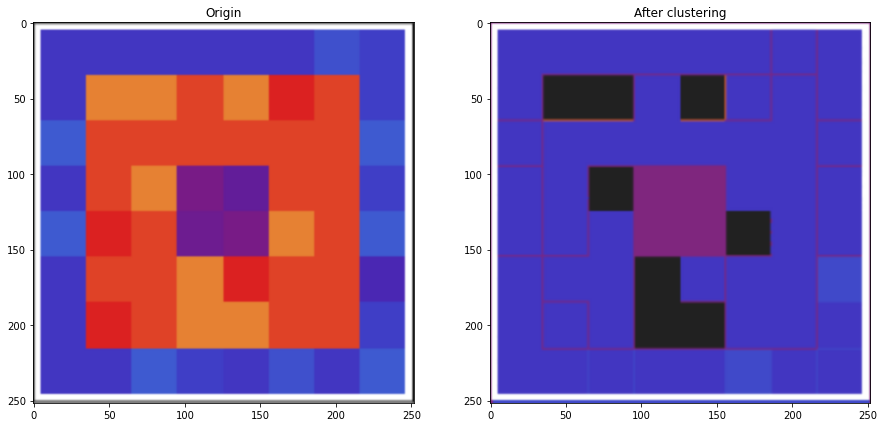

In [ ]:
Visual_Result(img=img1, algo='em', k = 8, coor=2, cal_score = True)

#**Thử nghiệm 5: Cố định thuật toán, cố định đặc trưng, thay đổi số cụm**

###**EM**

Time to evaluate: 122.43698930740356 s
Silhouette Coefficient: 0.4393032586080179



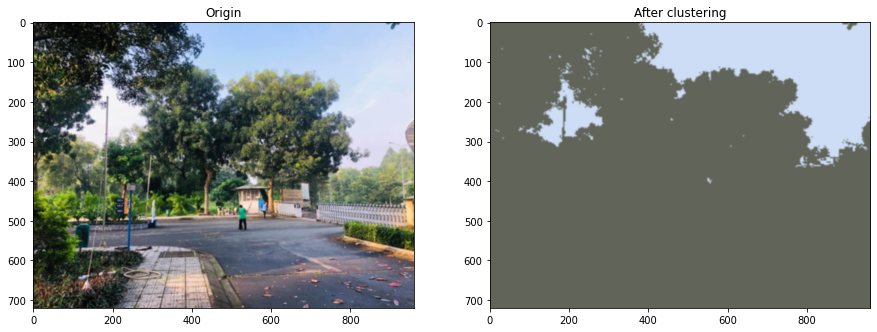

In [ ]:
Visual_Result(img=img4, algo='em', k = 2, coor=2, cal_score = True)

/usr/local/lib/python3.7/dist-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


Time to evaluate: 126.63914275169373 s
Silhouette Coefficient: 0.2321826580805691



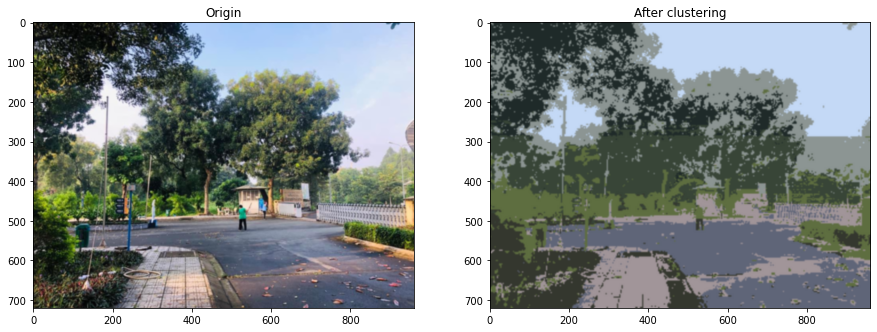

In [ ]:
Visual_Result(img=img4, algo='em', k = 8, coor=2, cal_score = True)

/usr/local/lib/python3.7/dist-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


Time to evaluate: 114.21430587768555 s
Silhouette Coefficient: 0.17943862903461139



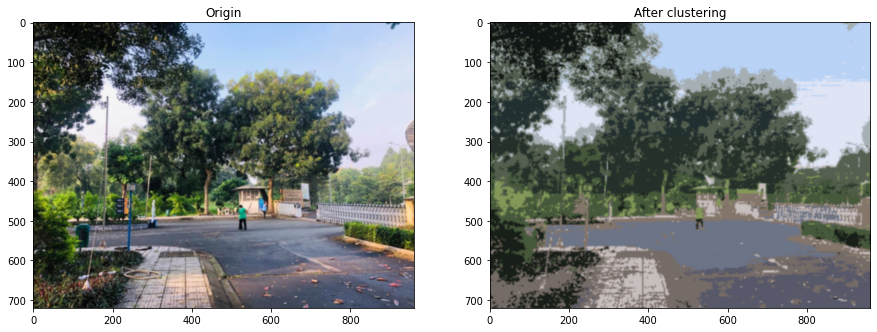

In [ ]:
Visual_Result(img=img4, algo='em', k = 15, coor=2, cal_score = True)

/usr/local/lib/python3.7/dist-packages/sklearn/mixture/_base.py:282: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  ConvergenceWarning,


Time to evaluate: 114.0223536491394 s
Silhouette Coefficient: 0.18234985306456986



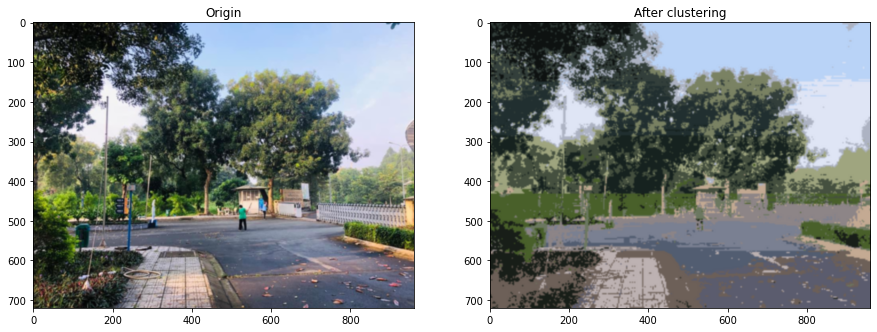

In [ ]:
Visual_Result(img=img4, algo='em', k = 20, coor=2, cal_score = True)

###**FCM**

Time to evaluate: 118.45639038085938 s
Silhouette Coefficient: 0.4578854442588259



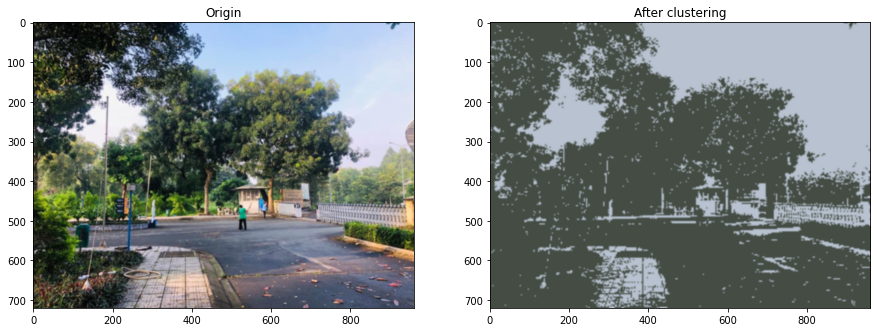

In [ ]:
Visual_Result(img=img4, algo='fcm', k = 2, coor=2, cal_score = True)

Time to evaluate: 114.61573553085327 s
Silhouette Coefficient: 0.36597672356896577



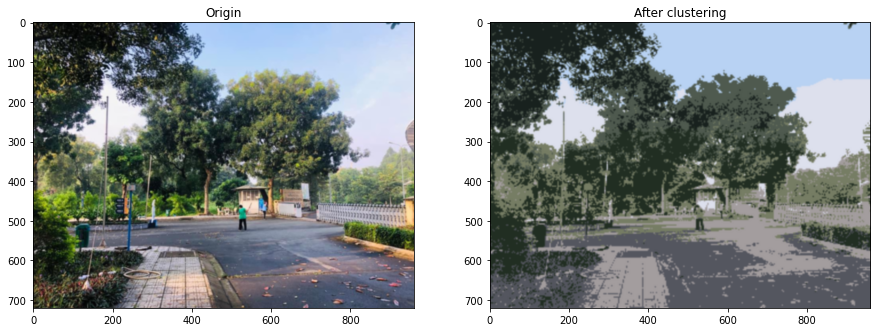

In [ ]:
Visual_Result(img=img4, algo='fcm', k = 8, coor=2, cal_score = True)

Time to evaluate: 113.39517331123352 s
Silhouette Coefficient: 0.32776238146936815



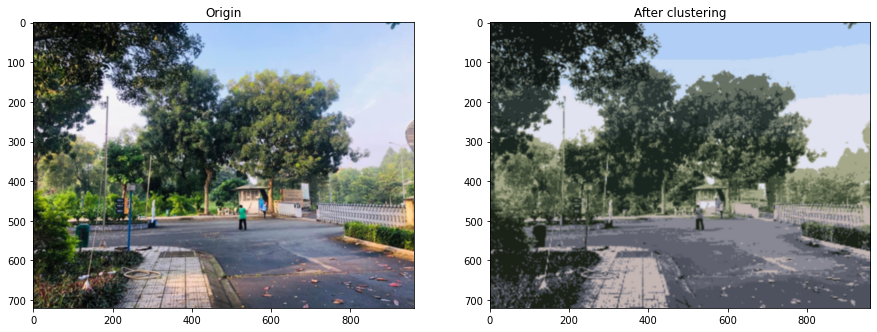

In [ ]:
Visual_Result(img=img4, algo='fcm', k = 15, coor=2, cal_score = True)

Time to evaluate: 113.01319289207458 s
Silhouette Coefficient: 0.3102681744047349



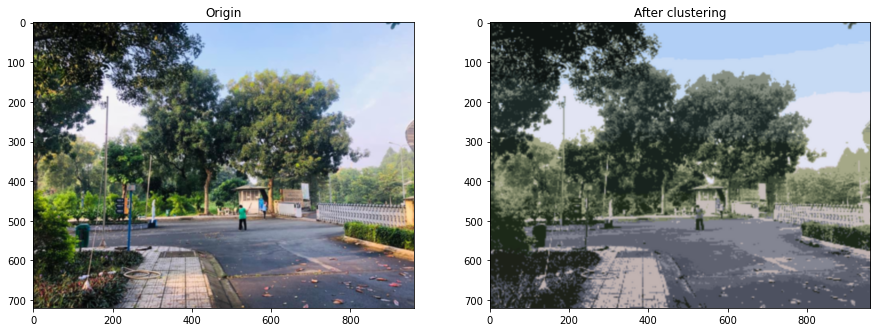

In [ ]:
Visual_Result(img=img4, algo='fcm', k = 20, coor=2, cal_score = True)

#**Thử nghiệm 7: Test**

In [ ]:
img7 = cv.imread("/content/drive/MyDrive/CS231.M11_NhapMonThiGiacMayTinh/Cài đặt/Images/2tan328p.png")
img8 = cv.imread("/content/drive/MyDrive/CS231.M11_NhapMonThiGiacMayTinh/Cài đặt/Images/Screenshot 2021-12-15 095118.png")
img9 = cv.imread("/content/drive/MyDrive/CS231.M11_NhapMonThiGiacMayTinh/Cài đặt/Images/tranh-phong-canh-3d-2.jpg")
img10 = cv.imread("/content/drive/MyDrive/CS231.M11_NhapMonThiGiacMayTinh/Cài đặt/Images/khong-gian-toan-hoc-anh-nen-3d-dep.jpg")
img11 = cv.imread("/content/drive/MyDrive/CS231.M11_NhapMonThiGiacMayTinh/Cài đặt/Images/81845b30ee29b3807f537dee8dda1e8d.png")

Time to evaluate: 111.57863688468933 s
Silhouette Coefficient: 0.8284113675888715



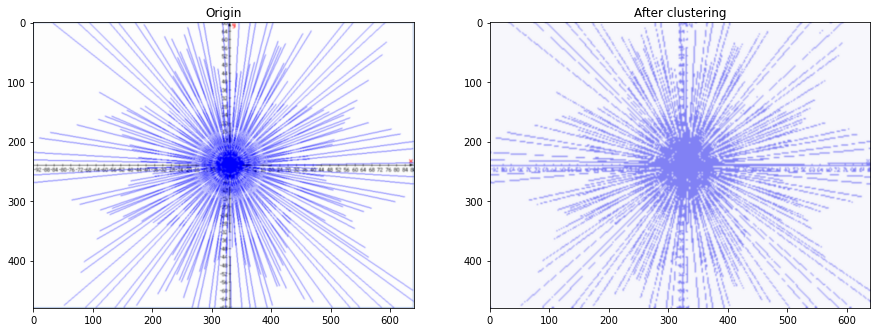

In [ ]:
Visual_Result(img=img7, algo='km', k = 2, coor=0, cal_score = True)

Time to evaluate: 0 s
Silhouette Coefficient: None



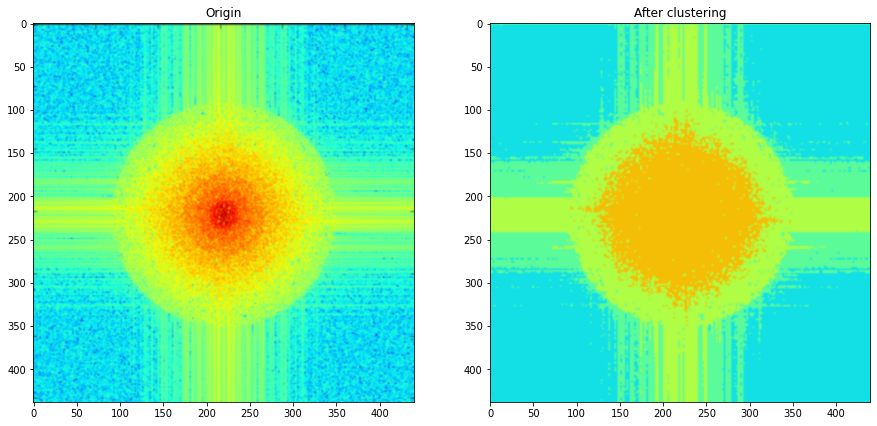

In [ ]:
Visual_Result(img=img8, algo='km', k = 4, coor=0, cal_score = False)

Time to evaluate: 0 s
Silhouette Coefficient: None



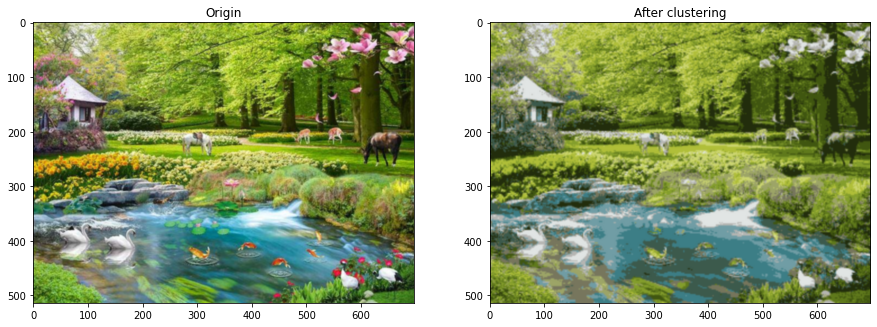

In [ ]:
Visual_Result(img=img9, algo='km', k = 13, coor=0, cal_score = False)

In [ ]:
Visual_Result(img=img9, algo='fcm', k = 13, coor=0, cal_score = False)

Time to evaluate: 169.98859977722168 s
Silhouette Coefficient: 0.5667511208703631



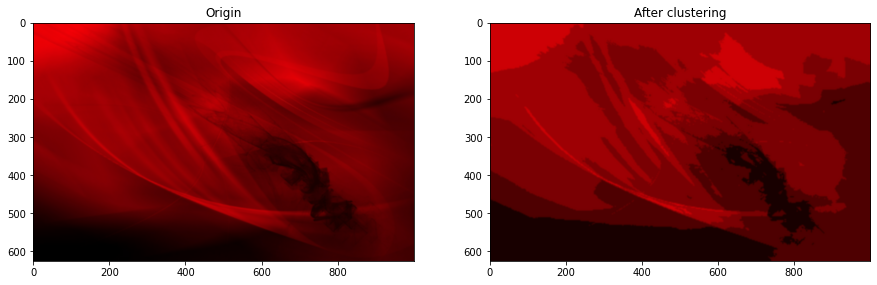

In [ ]:
Visual_Result(img=img11, algo='km', k = 5, coor=0, cal_score = True)

In [ ]:
img12 = cv.imread("/content/drive/MyDrive/CS231.M11_NhapMonThiGiacMayTinh/Cài đặt/Images/tải xuống.jpg")

Time to evaluate: 174.25032234191895 s
Silhouette Coefficient: 0.404347515989668



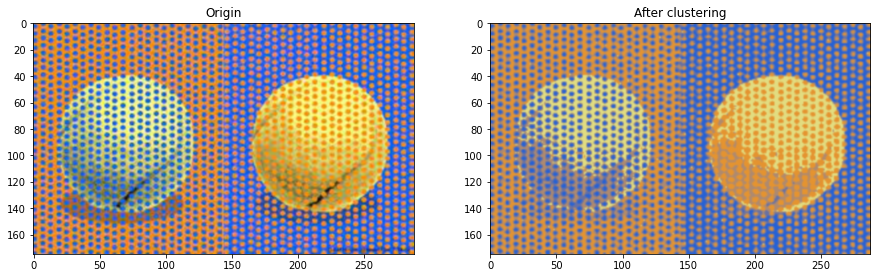

In [ ]:
Visual_Result(img=img12, algo='km', k = 5, coor=0, cal_score = True)

In [ ]:
img13 = cv.imread("/content/drive/MyDrive/CS231.M11_NhapMonThiGiacMayTinh/Cài đặt/Images/mau-chu-dep-bai-cay-gao_023607161.jpg")

Time to evaluate: 0 s
Silhouette Coefficient: None



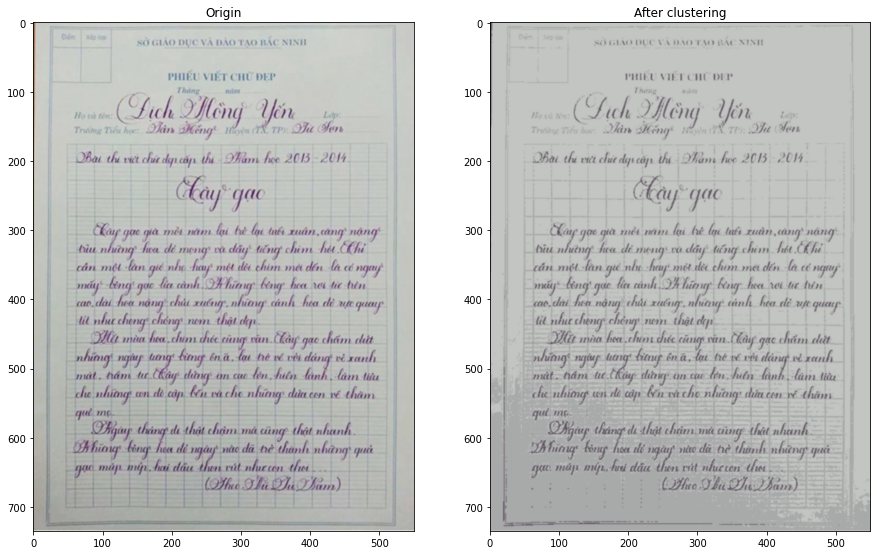

In [ ]:
Visual_Result(img=img13, algo='km', k = 3, coor=0, cal_score = False, resize_=False)

Time to evaluate: 0 s
Silhouette Coefficient: None



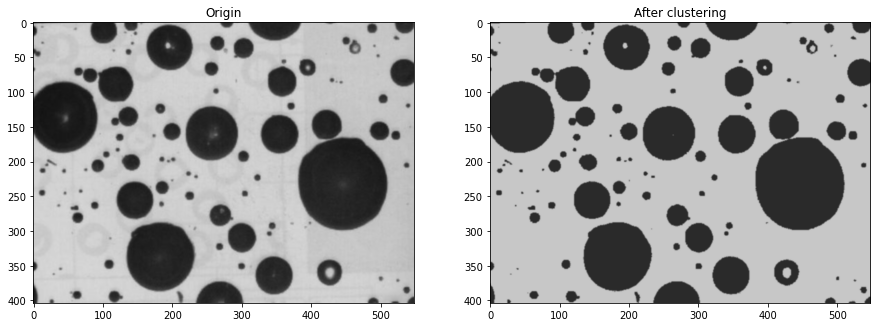

In [ ]:
img14 = cv.imread("/content/drive/MyDrive/CS231.M11_NhapMonThiGiacMayTinh/Cài đặt/Images/particles.bmp")
Visual_Result(img=img14, algo='km', k = 2, coor=0, cal_score = False, resize_=False)

Time to evaluate: 122.44308638572693 s
Silhouette Coefficient: 0.4393032586080179



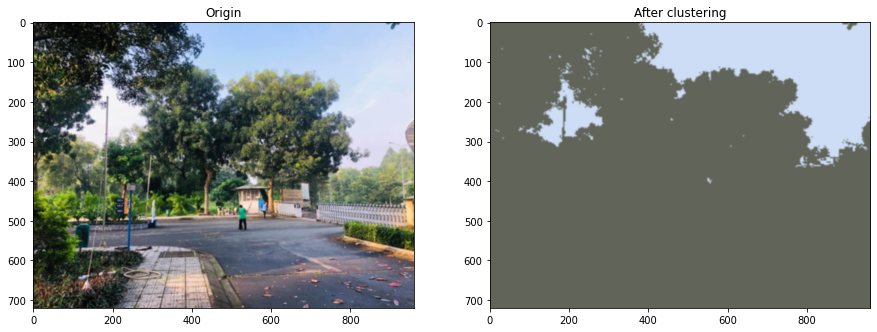

In [ ]:
Visual_Result(img=img4, algo='em', k = 2, coor=2, cal_score = True)

Time to evaluate: 117.95063662528992 s
Silhouette Coefficient: 0.49972281409326275



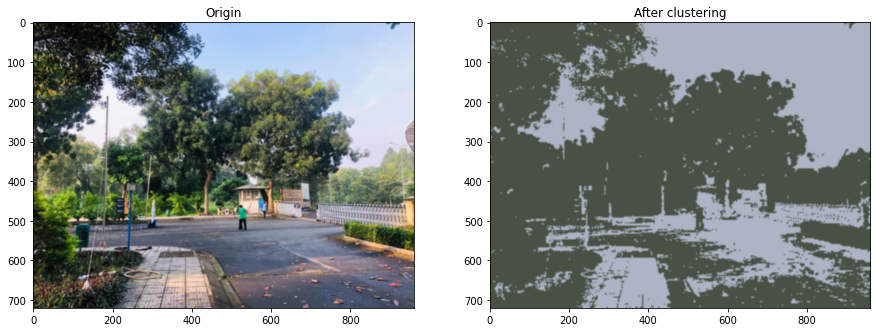

In [ ]:
Visual_Result(img=img4, algo='em', k = 2, coor=0, cal_score = True)